# Computational Intelligence Final Project (Object detection):

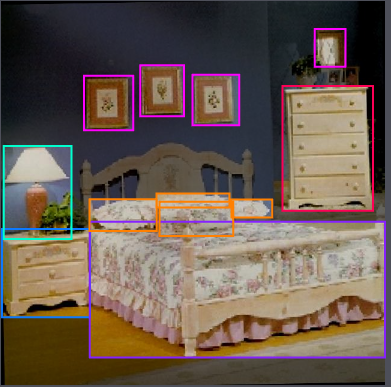

In this project, I will work with a dataset of bedroom images in order to detect the following classes:

1.   Bed
2.   Pillow
3.   Bed stand
4.   Picture
5.   Lamp
6.   Dresser
7.   Door
8.   Curtain
9.   Chair
10.  Window

I will use YOLOv5s as a base model for object detection. The architecture of the model will be modified by adding some layers that will help to improve the model accuracy for this specific dataset.

*   Downloading YOLOv5 and installing all its dependencies.

In [ ]:
import torch
torch.cuda.empty_cache()

!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5/
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 14936, done.
remote: Total 14936 (delta 0), reused 0 (delta 0), pack-reused 14936
Receiving objects: 100% (14936/14936), 13.93 MiB | 17.86 MiB/s, done.
Resolving deltas: 100% (10264/10264), done.
/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


The annotations of the images were made using RoboFlow (link to the project: https://app.roboflow.com/ci-xrxgt/object-detection-cf3ny/5). 315 Images in total were properly annotated, then with the help of data augmentation technic the dataset was augmented to 815 images (Training set: 750, Validation set: 45, Testing set 20).

*   Downloading dataset.

In [ ]:
%cd ..
!mkdir bedroom_images
%cd bedroom_images
!curl -L "https://app.roboflow.com/ds/fveCVocouO?key=IQZ85tN9mY" > bedrooms.zip
!unzip bedrooms.zip
!rm bedrooms.zip

/content
/content/bedroom_images
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1416      0 --:--:-- --:--:-- --:--:--  1414
100 48.7M  100 48.7M    0     0  11.7M      0  0:00:04  0:00:04 --:--:-- 16.0M
Archive:  bedrooms.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/N190000_jpg.rf.1f4fca2fb79ec1705318ec1cf9d7a208.jpg  
 extracting: test/images/OriginalWingRoom15_large_jpg.rf.88e5024a7a71b10837a891030f79b109.jpg  
 extracting: test/images/PeaceRoom_jpg.rf.4dcd172c5061b5c62ff0a4a0444ab889.jpg  
 extracting: test/images/ROOM0_20080320_102152_673_jpg.rf.317c5b6865edfca3808949bfbe8819cc.jpg  
 extracting: test/images/ROOM_jpg.rf.1584fd160d444838122f9cb7ce002e31.jpg  
 extracting: test/images/b24_jpg.rf.d3eb



*   Modifying data.yaml file by adding the correct path to the dataset.



In [ ]:
import yaml
config = {'path': '/content/bedroom_images',
         'train': '/content/bedroom_images/train/images',
         'val': '/content/bedroom_images/valid/images',
         'test': '/content/bedroom_images/test/images',
         'nc': 10,
         'names': ['bed', 'bedstand', 'chair', 'curtain', 'door', 'dresser', 'lamp', 'picture', 'pillow', 'window']}

with open("data.yaml", "w") as file:
   yaml.dump(config, file, default_flow_style=False)

*   Creating a custom yolov5 architecture (the yolov5s architecture was taken as a base model). The number of classes and the anchors (by default) were also modified.


In [ ]:
with open('/content/yolov5/models/custom_yolov5s.yaml', 'w+') as file:
    file.write(
        """
        # Parameters
        nc: 10  # number of classes
        depth_multiple: 0.33  # model depth multiple
        width_multiple: 0.50  # layer channel multiple
        anchors: 3  # AutoAnchor evolves 3 anchors per P output layer

        # YOLOv5 v6.0 backbone
        backbone:
          # [from, number, module, args]
          [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
           [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
           [-1, 3, C3, [128]],
           [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
           [-1, 6, C3, [256]],
           [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
           [-1, 9, C3, [512]],
           [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
           [-1, 3, C3, [1024]],
           [-1, 1, SPPF, [1024, 5]],  # 9
          ]

        # YOLOv5 v6.0 head
        head:
          [[-1, 1, Conv, [512, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 6], 1, Concat, [1]],  # cat backbone P4
           [-1, 3, C3, [512, False]],  # 13

           [-1, 1, Conv, [256, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 4], 1, Concat, [1]],  # cat backbone P3
           [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

           [-1, 1, Conv, [128, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 2], 1, Concat, [1]],  # cat backbone P2
           [-1, 1, C3, [128, False]],  # 21 (P2/4-xsmall)

           [-1, 1, Conv, [128, 3, 2]],
           [[-1, 18], 1, Concat, [1]],  # cat head P3
           [-1, 3, C3, [256, False]],  # 24 (P3/8-small)

           [-1, 1, Conv, [256, 3, 2]],
           [[-1, 14], 1, Concat, [1]],  # cat head P4
           [-1, 3, C3, [512, False]],  # 27 (P4/16-medium)

           [[21, 24, 27], 1, Detect, [nc, anchors]],  # Detect(P2, P3, P4)
          ]
        """
    )



*   Defining parameters for model training.



In [ ]:
%cd /content/yolov5/

SIZE = 640
BATCH_SIZE = 32
EPOCHS = 300
MODEL = "custom_yolov5s"
WORKERS = 1
PROJECT = "bedrooms_images_pyimagesearch"
RUN_NAME = f"{MODEL}_size{SIZE}_epochs{EPOCHS}_batch{BATCH_SIZE}_small"

/content/yolov5




*   Model training.



In [ ]:
!python train.py --img {SIZE}\
               --batch {BATCH_SIZE}\
               --epochs {EPOCHS}\
               --data ../bedroom_images/data.yaml\
               --weights yolov5s.pt\
               --cfg {MODEL}.yaml\
               --workers {WORKERS}\
               --project {PROJECT}\
               --name {RUN_NAME}\
               --exist-ok\
               --cache

train: weights=yolov5s.pt, cfg=custom_yolov5s.yaml, data=../bedroom_images/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=1, project=bedrooms_images_pyimagesearch, name=custom_yolov5s_size640_epochs300_batch32_small, exist_ok=True, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-59-gfdc35b1 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, 



*   Training Metrics



In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./bedrooms_images_pyimagesearch

<IPython.core.display.Javascript object>

/content/yolov5


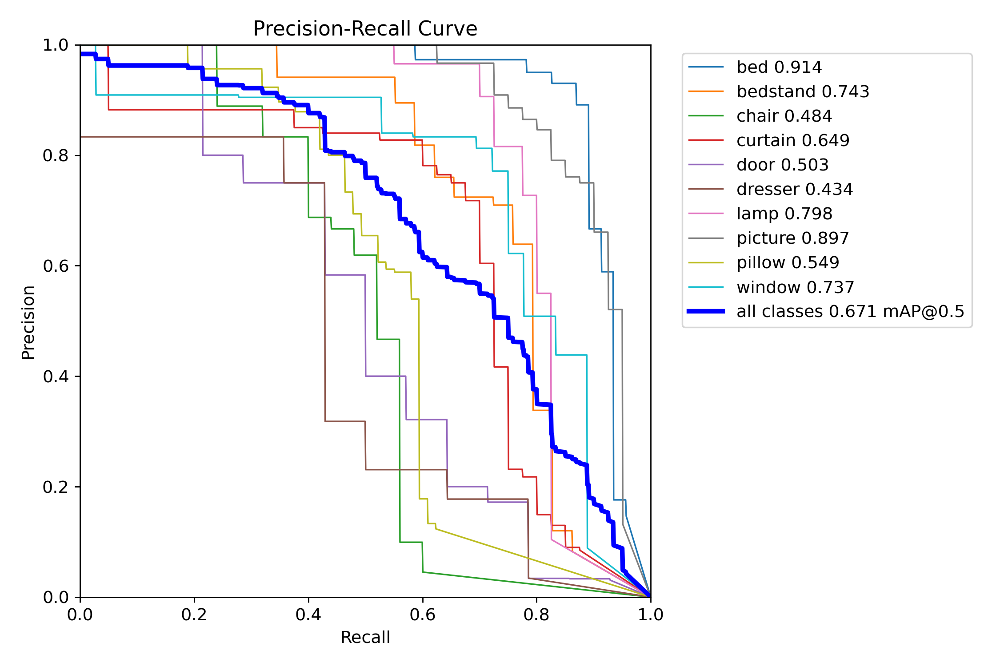

In [ ]:
from IPython.display import Image

%cd /content/yolov5/

filename = 'bedrooms_images_pyimagesearch/' + RUN_NAME + '/PR_curve.png'
Image(filename=filename, width=900)



*   Inference on Test Images



In [ ]:
!python detect.py --weights bedrooms_images_pyimagesearch/{RUN_NAME}/weights/best.pt\
                  --img 640\
                  --conf 0.4\
                  --source ../bedroom_images/test/images

detect: weights=['bedrooms_images_pyimagesearch/custom_yolov5s_size640_epochs300_batch32_small/weights/best.pt'], source=../bedroom_images/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-59-gfdc35b1 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 174 layers, 5387687 parameters, 0 gradients, 17.2 GFLOPs
image 1/20 /content/bedroom_images/test/images/N190000_jpg.rf.1f4fca2fb79ec1705318ec1cf9d7a208.jpg: 640x640 1 bed, 1 pillow, 1 window, 14.0ms
image 2/20 /content/bedroom_images/test/images/OriginalWingRoom15_large_jpg.rf.88e5024a7a71b10837a891030f79b109.jpg: 640x640 

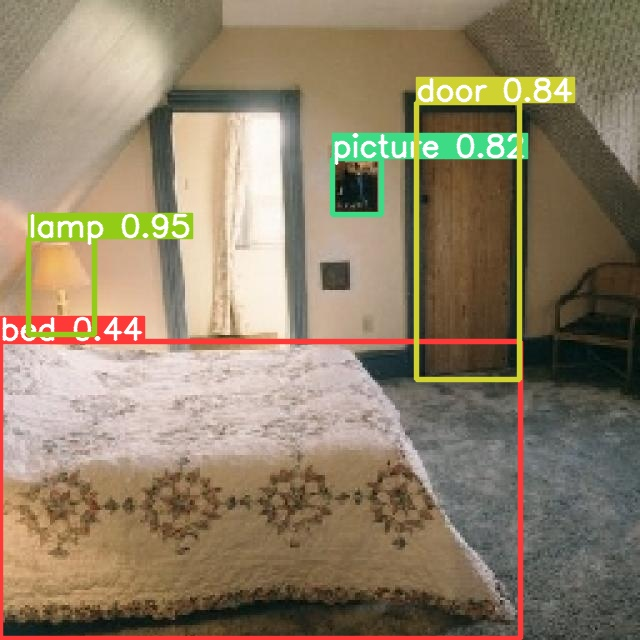

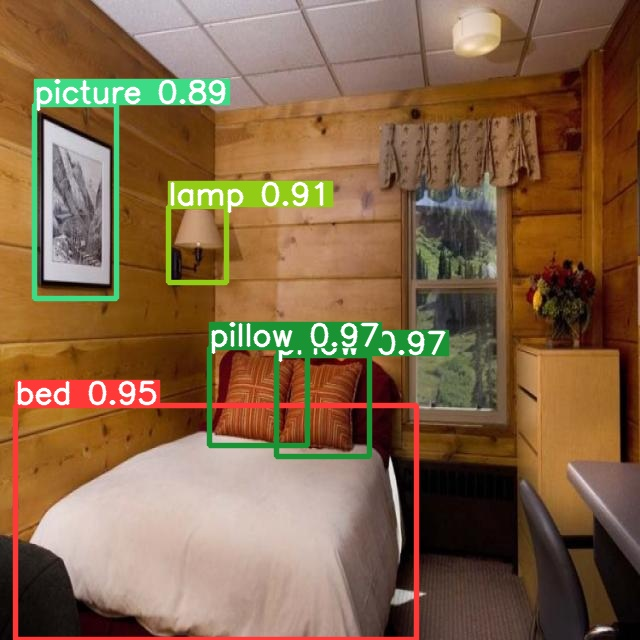

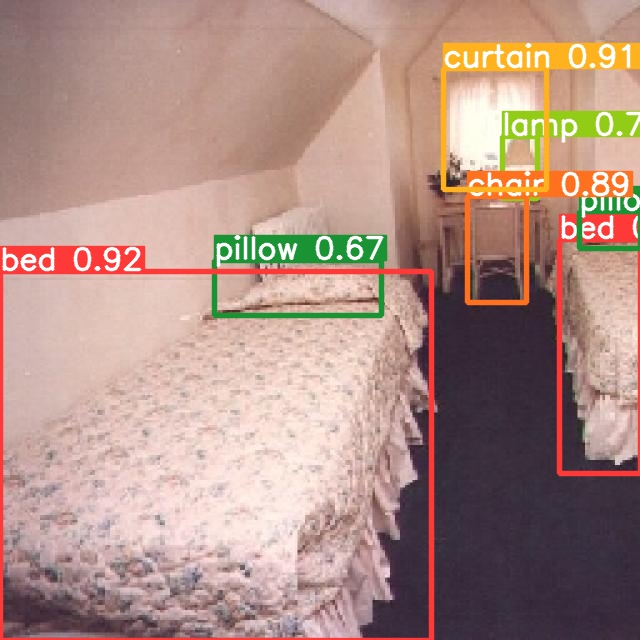

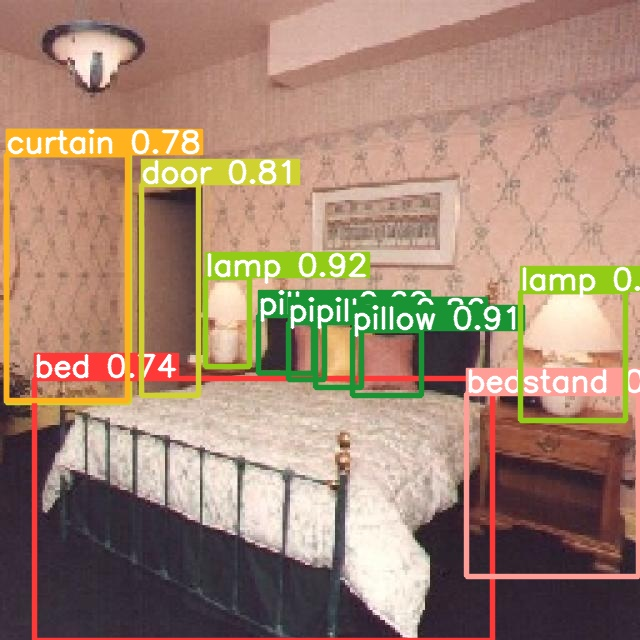

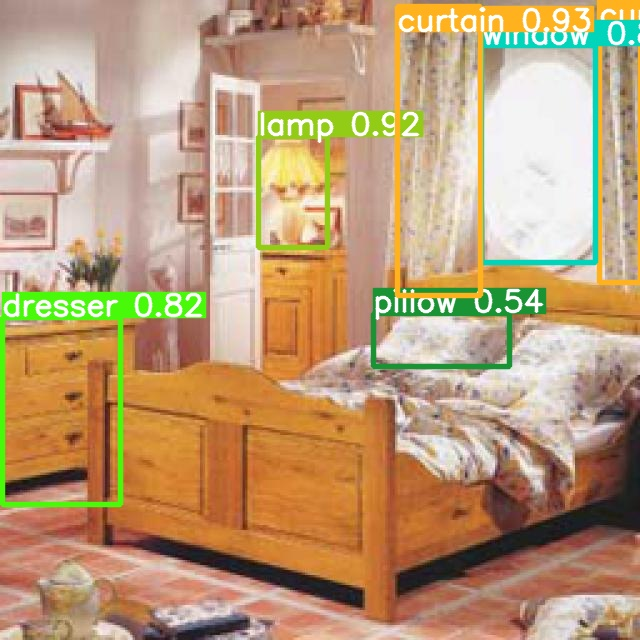

...

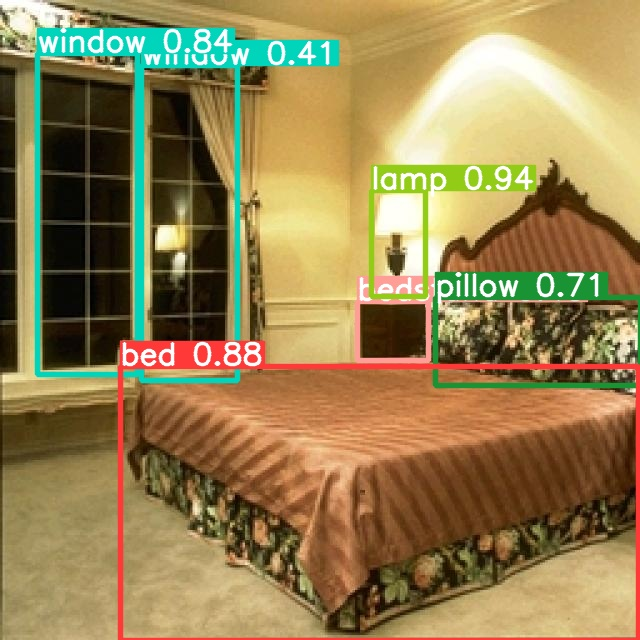

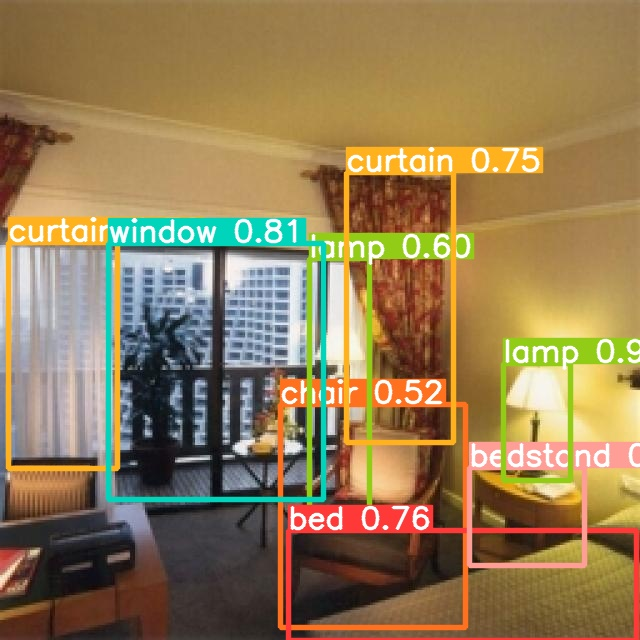

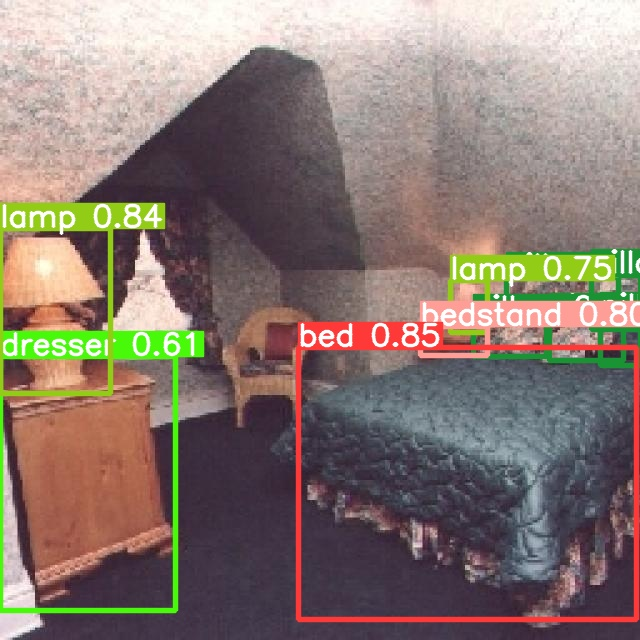

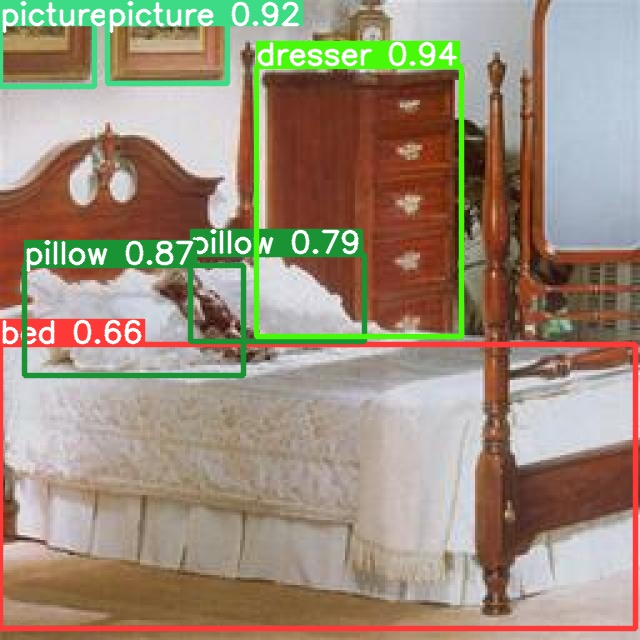

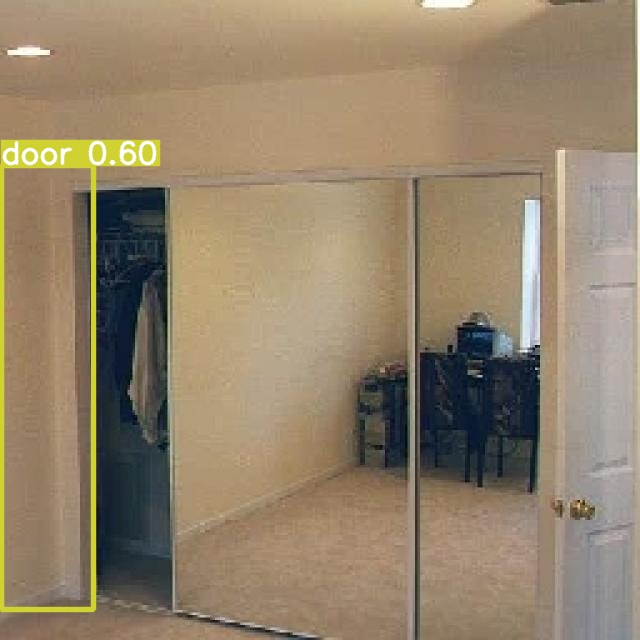

In [ ]:
import glob
from IPython.display import display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

## Conclusion

This model with a shorter architecture in comparison with the other model (created and trained in a different notebook) has, in general, values slightly better in the metrics: precision and mAP, for all the classes in the dataset. This model was trained with less number of epochs (300) and with a batch size equal to 32. In the other model, the number of epochs was 500 and the batch size equal to 64, but the training was interrupted because there was not found and improvement in the training.